# Insurance Claim Fraud Detection

Problem Statement:

In this project, on the basis of several independent features, we are going to predict if an insurance claim is fraudulent or not. 

In [1]:
#Importing Necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
#Loading the dataset

df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")

In [3]:
#Checking first 5 rows of the dataset

df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# Exploratory Data Analysis (EDA)

In [4]:
#Checking the shape of the dataset

df.shape

(1000, 40)

There are a total of 8425 rows and 23 columnns.

In [5]:
#Checking the Info of the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

From the above result, we can see that there are no null values present in the dataset except for _c39 column.

In [6]:
# Dropping _c39 column
df.drop("_c39",axis=1,inplace=True)

In [7]:
#Checking the null-values in the dataset

df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

<Axes: >

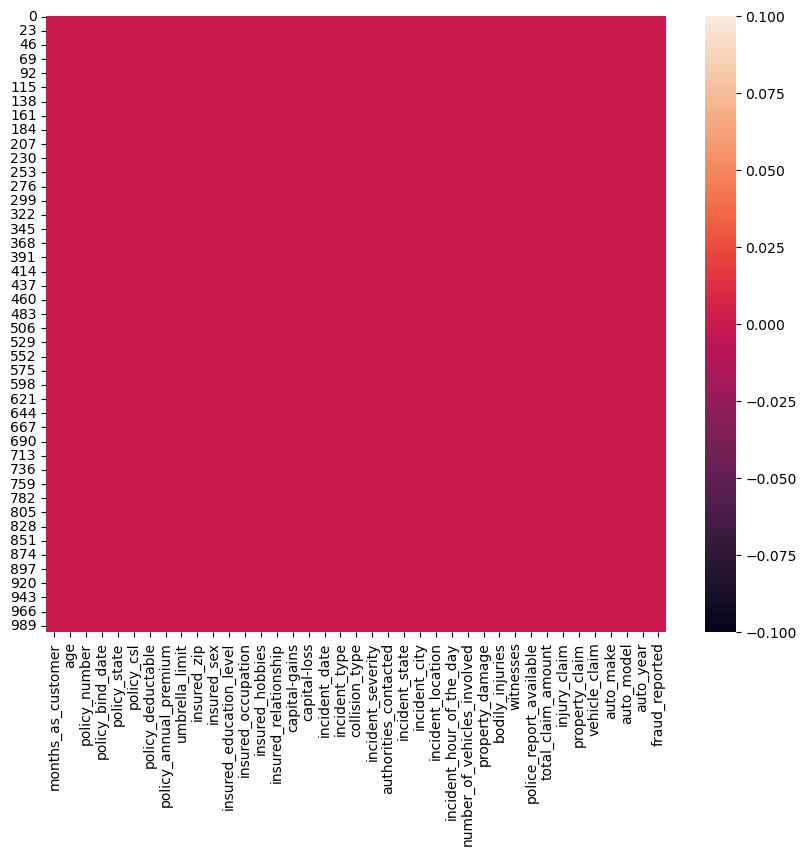

In [8]:
plt.figure(figsize=(10,8))
sns.heatmap(df.isnull())

In [9]:
#Let's divide the dataset into categorical and numerical columns on the basis of the data type

categorical_col=[]
for i in df.dtypes.index:
    if df[i].dtypes==object:
        categorical_col.append(i)
        
print("Categorical Columns present in the dataset: ", categorical_col)
print('\n')
print('*'*100)
print('\n')

numerical_col=[]
for i in df.dtypes.index:
    if df[i].dtypes!=object:
        numerical_col.append(i)
        
print("Numerical Columns present in the dataset: ", numerical_col)

Categorical Columns present in the dataset:  ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


****************************************************************************************************


Numerical Columns present in the dataset:  ['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


In [10]:
#checking the number of unique values in each column of the dataset

df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [11]:
#Checking the value counts of each column of the dataset

for i in df.columns:
    print(df[i].value_counts())
    print('\n')
    print('*'*50)
    print('\n')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


**************************************************


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


**************************************************


521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64


**************************************************


01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09

In [12]:
#Replacing the value of "?" with nan values first

df=df.replace('?',np.nan)

In [13]:
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [14]:
#Imputing the nan values with the mode of the data

df['collision_type'].fillna(df['collision_type'].mode()[0], inplace=True)
df['property_damage'].fillna(df['property_damage'].mode()[0], inplace=True)
df['police_report_available'].fillna(df['police_report_available'].mode()[0], inplace=True)

In [15]:
#Changing the dtype of Date from Object to Date type

df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['policy_bind_year']=df['policy_bind_date'].apply(lambda x:x.year)
df['policy_bind_month']=df['policy_bind_date'].apply(lambda x:x.month)
df['policy_bind_day']=df['policy_bind_date'].apply(lambda x:x.day)

In [16]:
df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_year']=df['incident_date'].apply(lambda x:x.year)
df['incident_month']=df['incident_date'].apply(lambda x:x.month)
df['incident_day']=df['incident_date'].apply(lambda x:x.day)

In [17]:
#Dropping the columns - ("policy_bind_date" and "incident_date")

df.drop(columns=["policy_bind_date","incident_date"],axis=1,inplace=True)

In [18]:
#Dropping the columns - ("policy_number" and "incident_location") as these columns have 1000 unique values

df.drop("policy_number",axis=1,inplace=True)
df.drop("incident_location",axis=1,inplace=True)

In [19]:
#Dropping the column - (unmbrella_limit) as this column contains almost 80% values as 0

df.drop("umbrella_limit",axis=1,inplace=True)

In [20]:
#Dropping the column - (insured_zip) as this column is unique and 995 values are available for 1000 people

df.drop("insured_zip",axis=1,inplace=True)

In [21]:
#Checking the unique values of each column of the dataset

df.nunique().to_frame("Number of Unique Values")

,Number of Unique Values
months_as_customer,391
age,46
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20


In [22]:
#Dropping incident_year as there's only one value throughout the dataset

df.drop("incident_year",axis=1,inplace=True)

In [23]:
#Seperating two different values for policy_csl(X/Y) as each value represents a range within which the insurer will cover losses resulting from a single incident, with X representing the bodily injury coverage limit and Y representing the property damage coverage limit.

df[['bodily_injury_limit', 'property_damage_limit']] = df['policy_csl'].str.split('/', expand=True).astype(int)

In [24]:
# Dropping policy_csl column
df.drop("policy_csl",axis=1,inplace=True)

In [25]:
#Checking the statistical information of the numerical columns in the dataset

df.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,203.95400,115.113174,0.00,115.7500,199.5,276.250,479.00
age,1000.0,38.94800,9.140287,19.00,32.0000,38.0,44.000,64.00
policy_deductable,1000.0,1136.00000,611.864673,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1256.40615,244.167395,433.33,1089.6075,1257.2,1415.695,2047.59
capital-gains,1000.0,25126.10000,27872.187708,0.00,0.0000,0.0,51025.000,100500.00
capital-loss,1000.0,-26793.70000,28104.096686,-111100.00,-51500.0000,-23250.0,0.000,0.00
incident_hour_of_the_day,1000.0,11.64400,6.951373,0.00,6.0000,12.0,17.000,23.00
number_of_vehicles_involved,1000.0,1.83900,1.018880,1.00,1.0000,1.0,3.000,4.00
bodily_injuries,1000.0,0.99200,0.820127,0.00,0.0000,1.0,2.000,2.00
witnesses,1000.0,1.48700,1.111335,0.00,1.0000,1.0,2.000,3.00


Conclusion:     

The count of every column is 1000, which means there are no null values in the dataset.

For the columns (policy_deductable, capital-gains, injury_claim), the mean value is higher than the median (50%) indicating a rightward skew in the data.

For the columns (claim_amount, car_claim), the median value is higher than the mean value indicating a leftward skewed distribution.

The mean and median values of some columns(age, policy_annual_premium, policy_bind_year, auto_year) are almost equal, so we can say that the distribution of these columns will be normally distributed.

There's a huge difference between 75% and maximum, which indicates the presence of outliers in the dataset.

# Data Visualization

In [26]:
categorical_col=[]
for i in df.dtypes.index:
    if df[i].dtypes==object:
        categorical_col.append(i)
        
print("Categorical Columns present in the dataset: ", categorical_col)
print('\n')
print('*'*100)
print('\n')

numerical_col=[]
for i in df.dtypes.index:
    if df[i].dtypes!=object:
        numerical_col.append(i)
        
print("Numerical Columns present in the dataset: ", numerical_col)

Categorical Columns present in the dataset:  ['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


****************************************************************************************************


Numerical Columns present in the dataset:  ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_bind_year', 'policy_bind_month', 'policy_bind_day', 'incident_month', 'incident_day', 'bodily_injury_limit', 'property_damage_limit']


Univariate and Bivariate Analysis

In [27]:
sns.set()

N    753
Y    247
Name: fraud_reported, dtype: int64

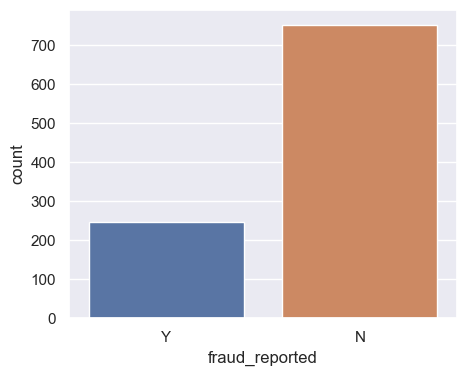

In [28]:
#Checking the count plot of target variable

plt.figure(figsize=(5,4))
sns.countplot(x=df['fraud_reported'],data=df)
df['fraud_reported'].value_counts().sort_values(ascending=False)

fraud_reported is N is much higher than Y; we will balance this class later using the SMOTE technique.

In [29]:
#Checking the count plots of the categorical columns

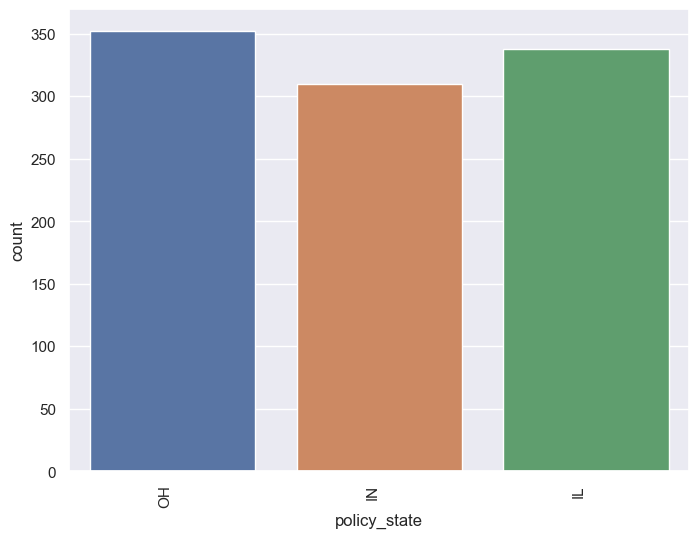

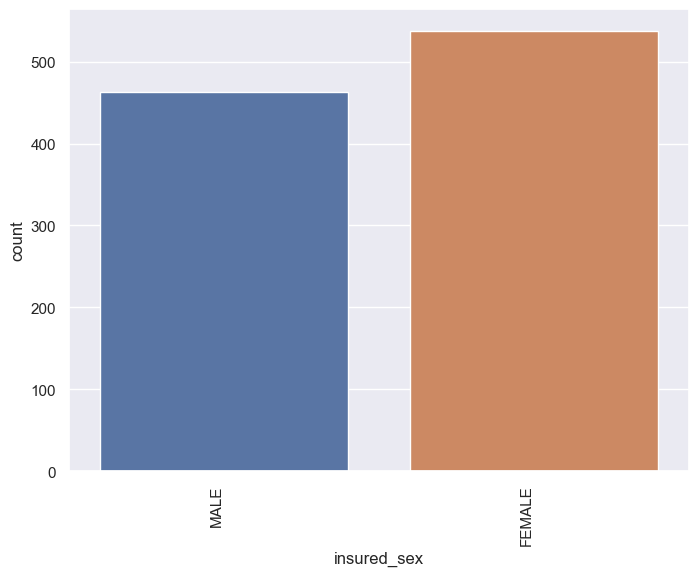

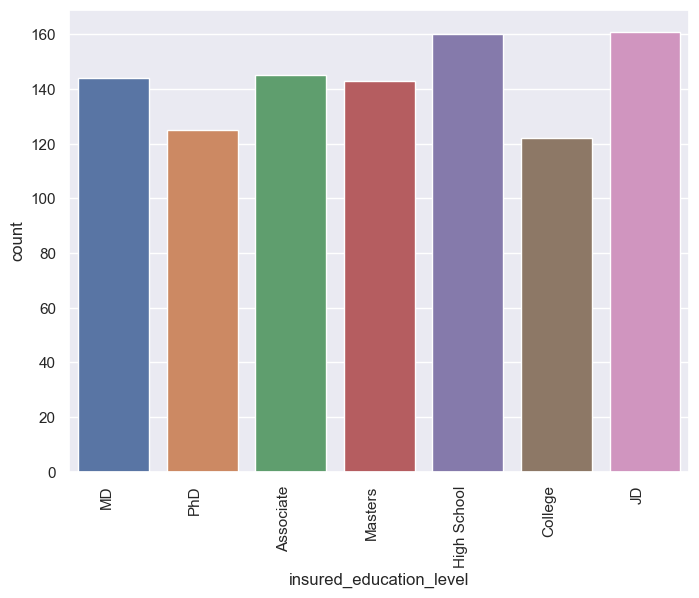

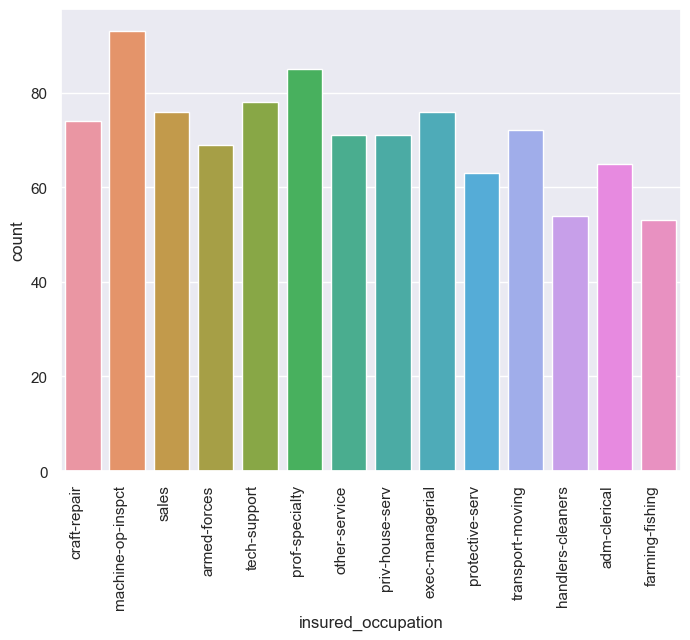

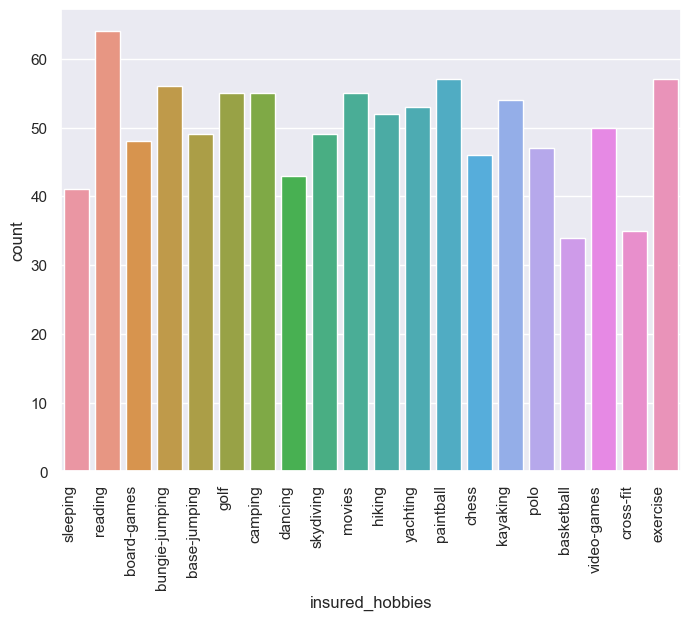

...

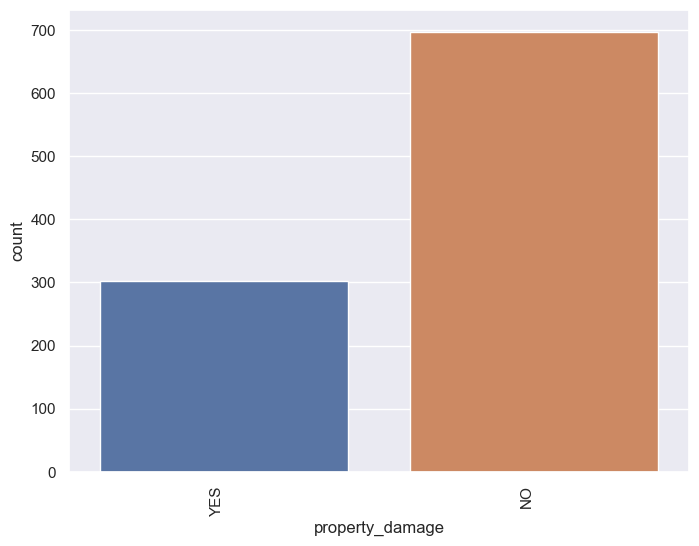

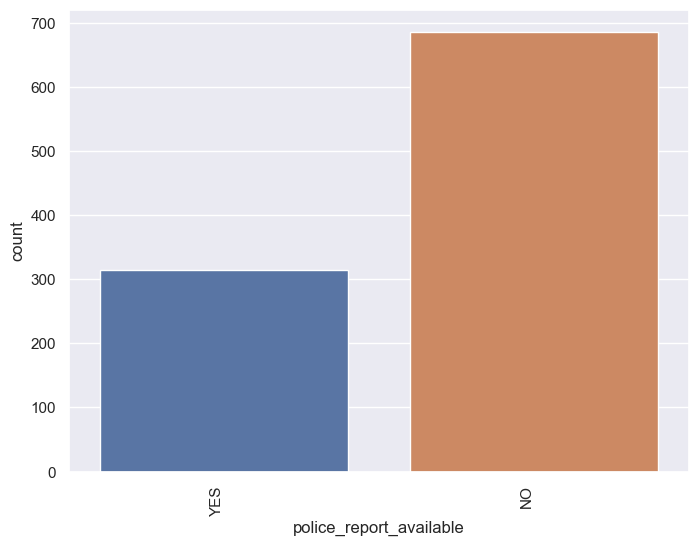

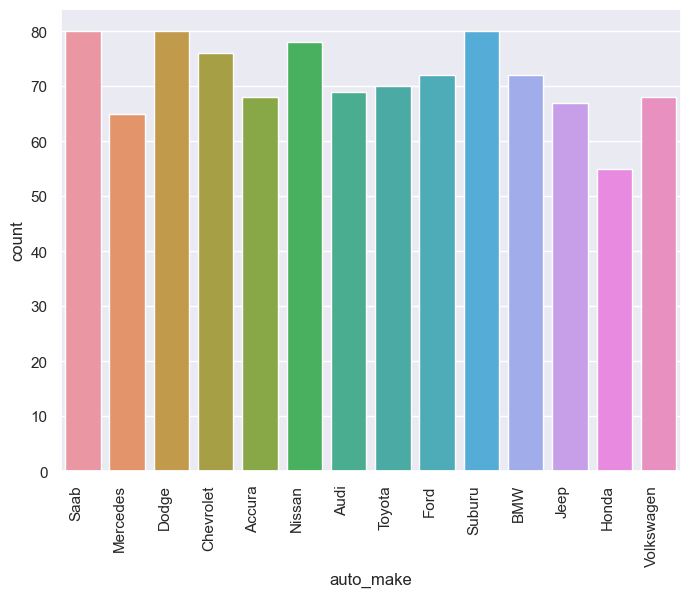

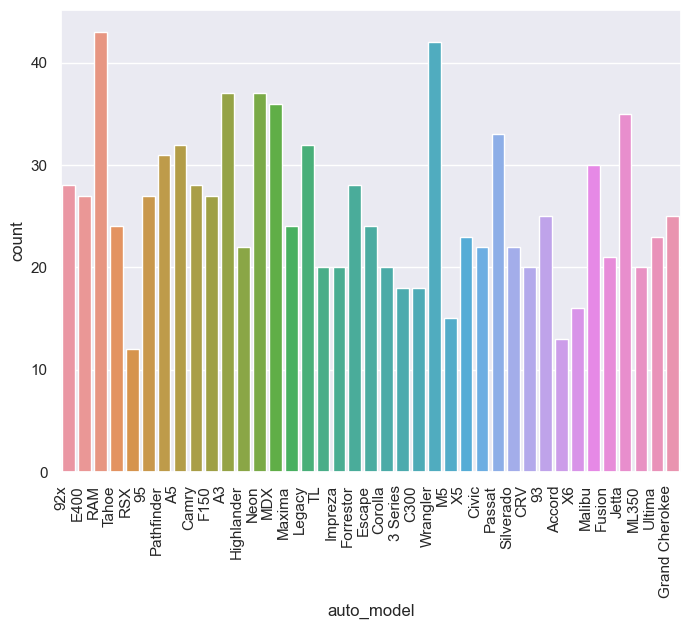

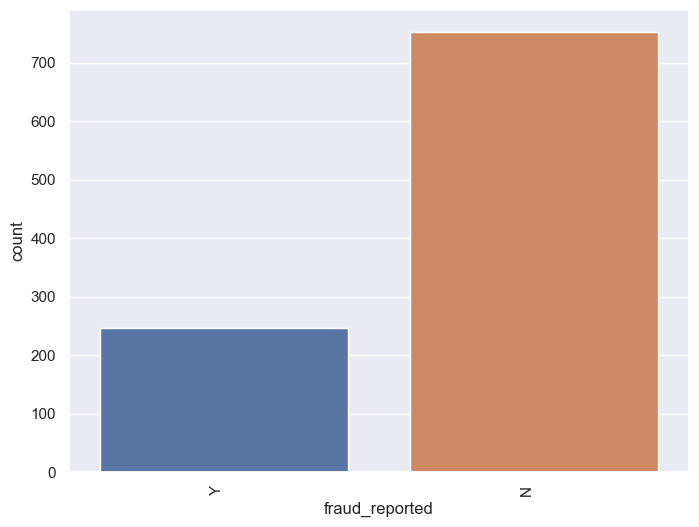

In [30]:
for i in categorical_col:
    plt.figure(figsize=(8,6))
    sns.countplot(x=df[i], data=df)
    plt.xticks(rotation=90,ha='right')
plt.show()

Conclusion:

The value count of "policy_state" is the highest for OH and the lowest for IN. The number of females is higher than the number of males in this dataset. For the education level column, most of the people are JD, followed by people who completed high school, and then MD. For the occupation column, the maximum number of people are machine-op-inspct, followed by prof-specialty and tech-support. For the hobbies column, most of the people are readers, followed by exercise enthusiasts and those who play paintball. For the relationship column, most of them are own- children, followed by other- relatives. For incident types, single- and multi-vvehicle collisions are high. For collision type, rear collision is the highest. For incident severity, minor damage tops the chart, while trivial damage is the least. If we talk about the authorities contacted, police are the most frequently contacted, while none are the least. For incident states, NY is the highest, followed by SC. For the incident city, Springfiled is at the top and Northbrook at the bottom. For the property damage column, no is greater than yes. For the police report available, No is again way higher than Yes. For the auto-make column, Dodge, Suburu, and Saab are at the top, while Honda is the least. For the auto model, Wrangler and RAM are at the top.

In [31]:
#Checking the distribution plots of the numerical columns

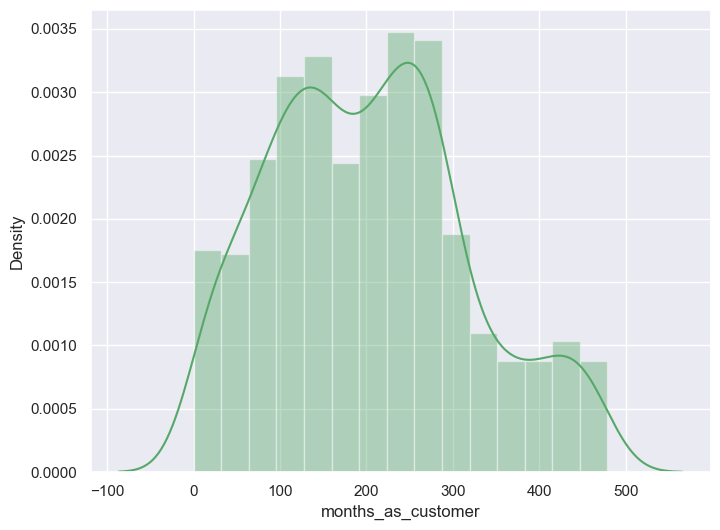

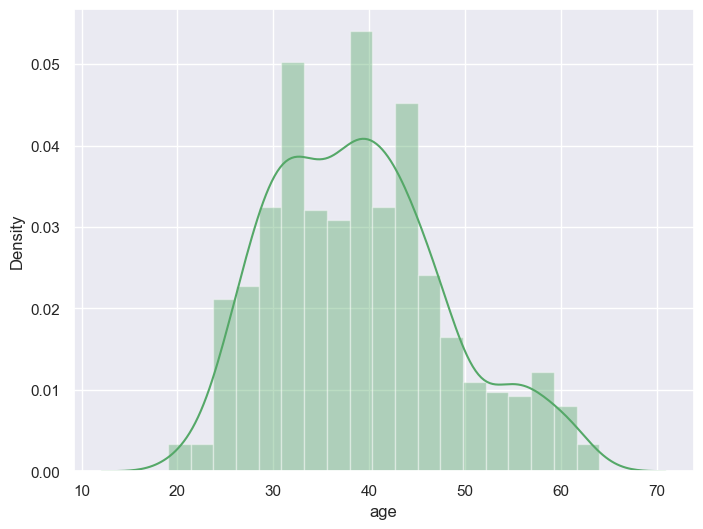

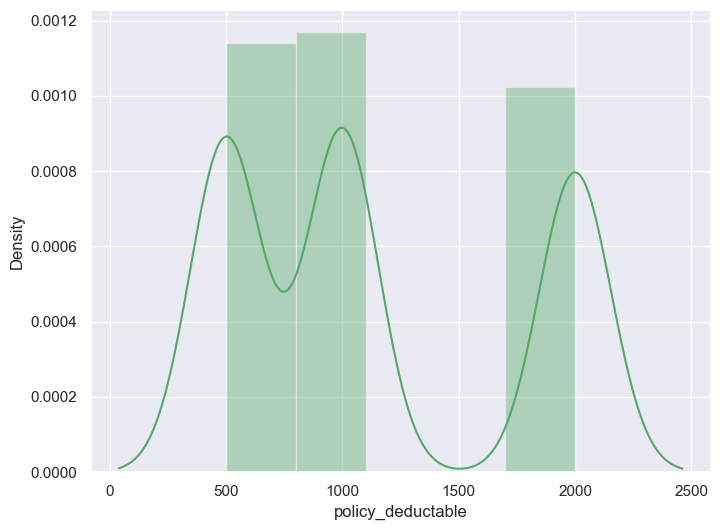

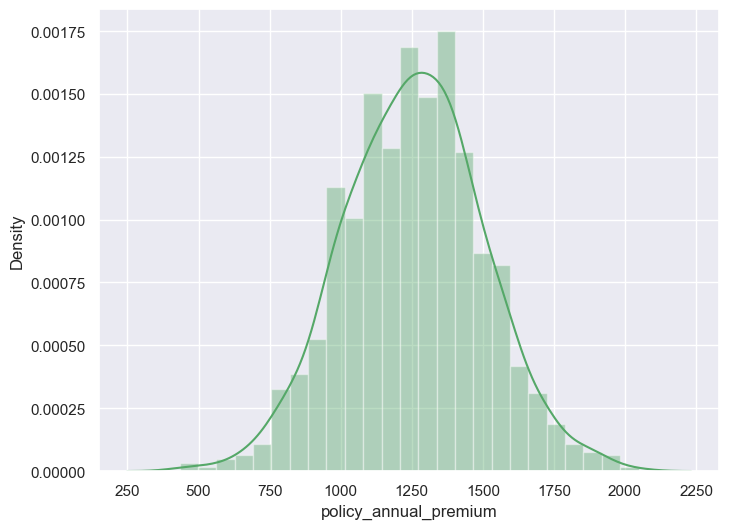

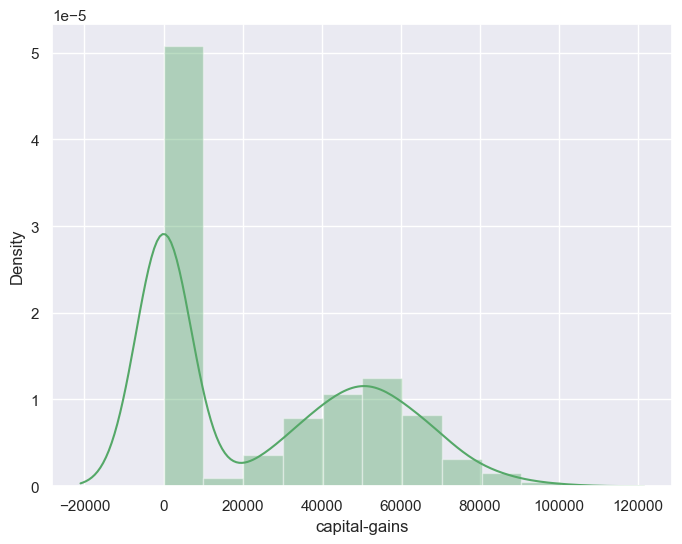

...

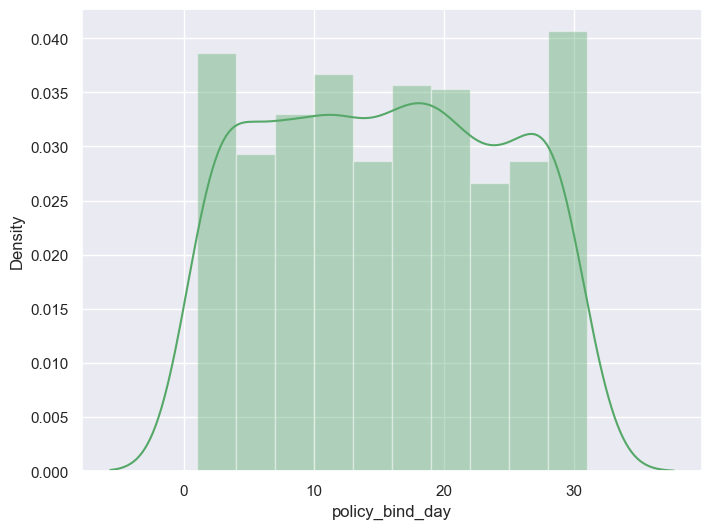

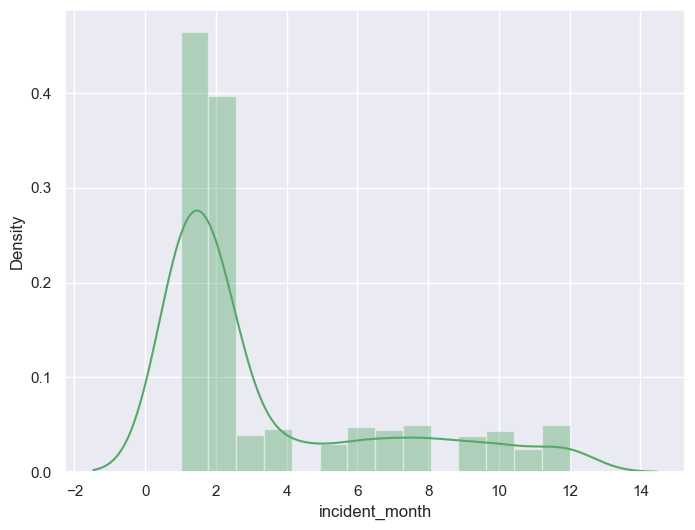

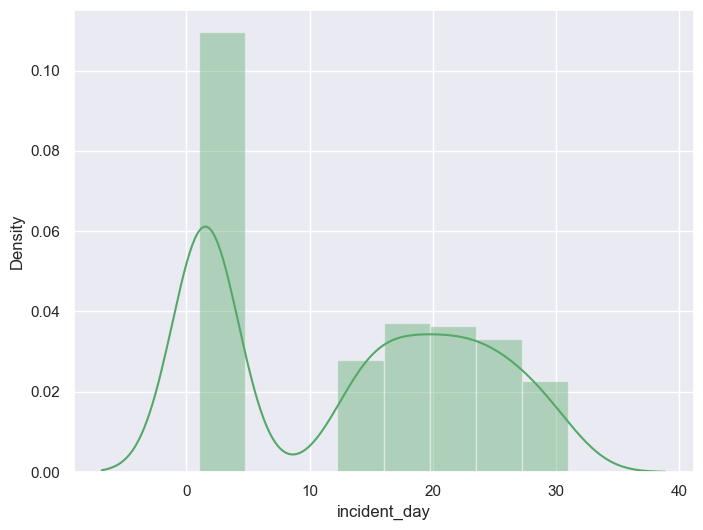

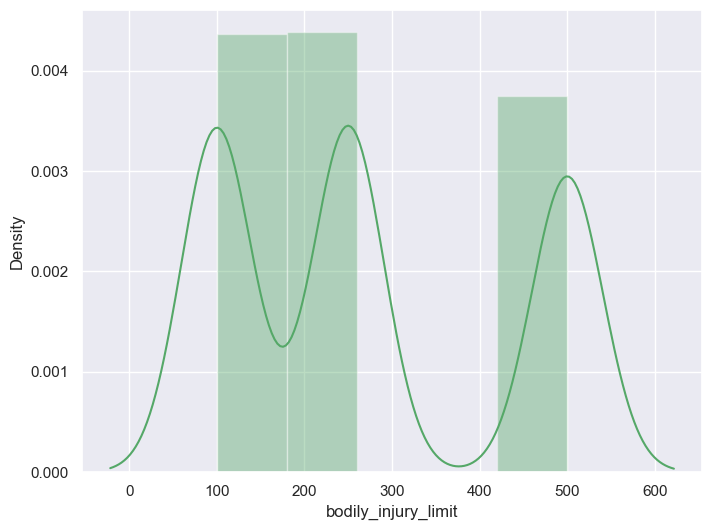

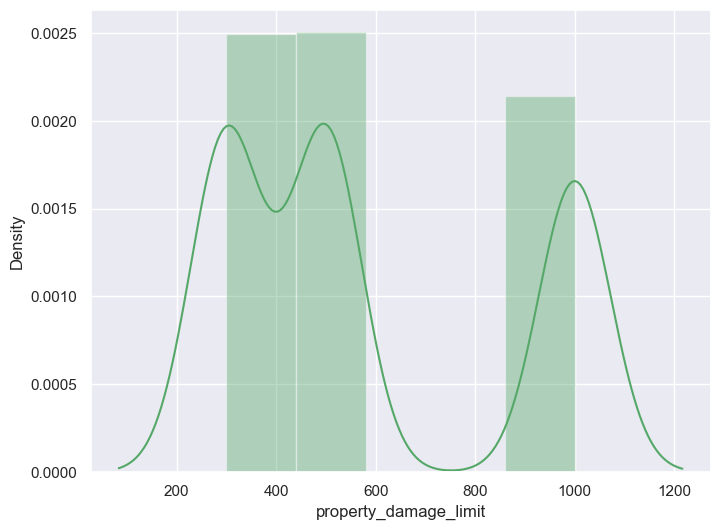

In [32]:
for i in numerical_col:
    plt.figure(figsize=(8,6))
    sns.distplot(df[i], color='g')
plt.show()

For the columns (policy_deductable, capital-gains, injury_claim), the mean value is higher than the median (50%) indicating a rightward skew in the data. For the columns (claim_amount, car_claim), the median value is higher than the mean value indicating a leftward skewed distribution. The mean and median values of some columns(age, policy_annual_premium, policy_bind_year, auto_year) are almost equal, so we can say that the distribution of these columns will be normally distributed.

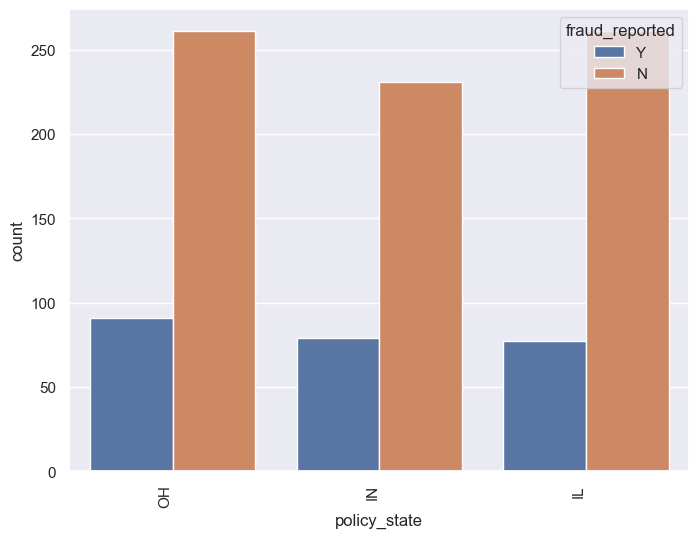

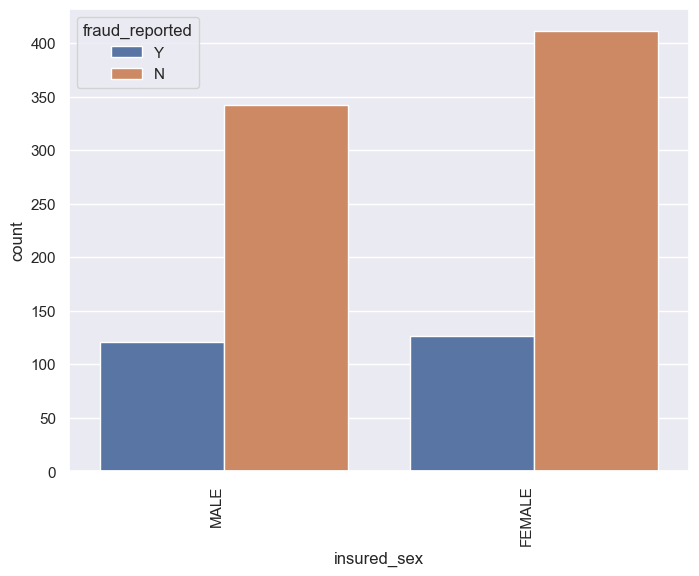

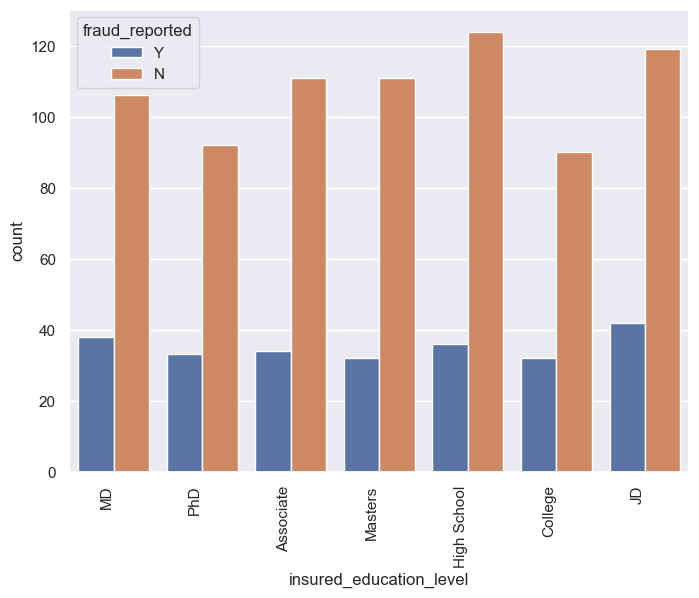

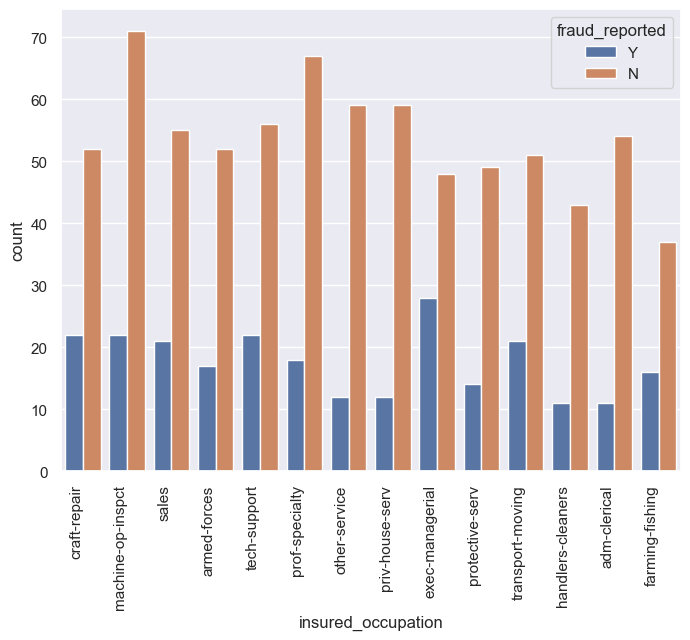

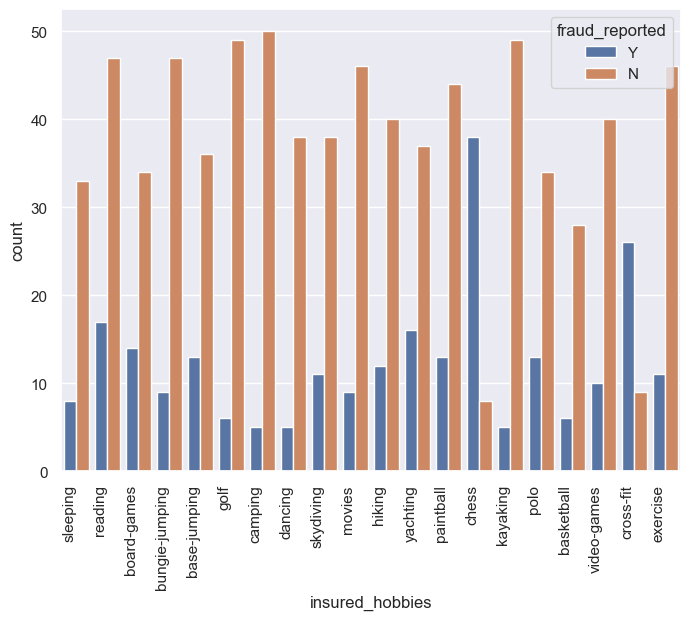

...

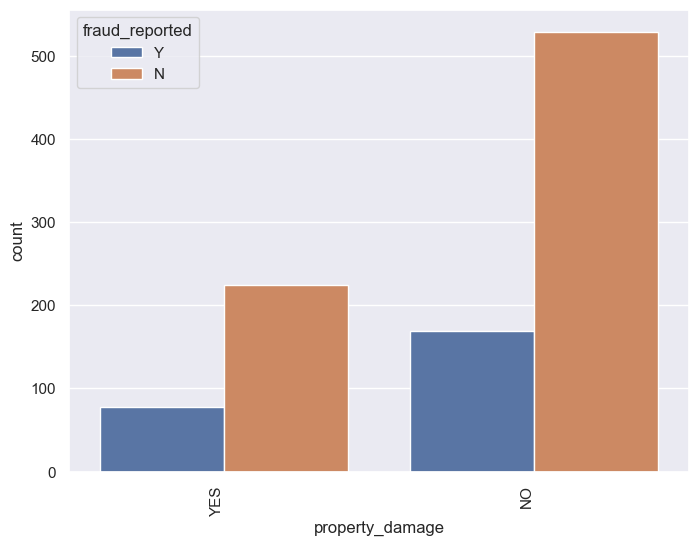

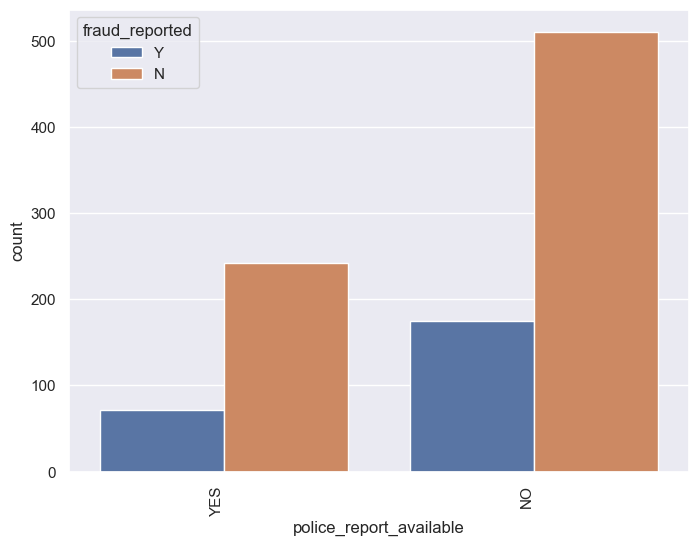

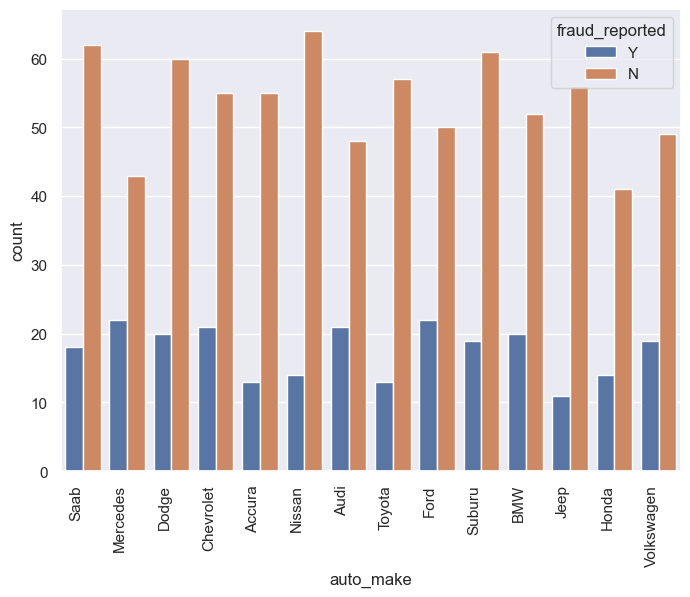

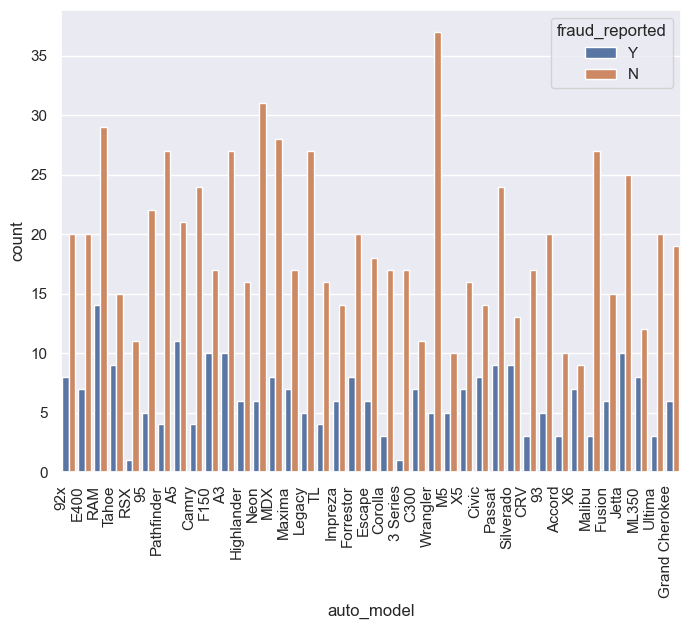

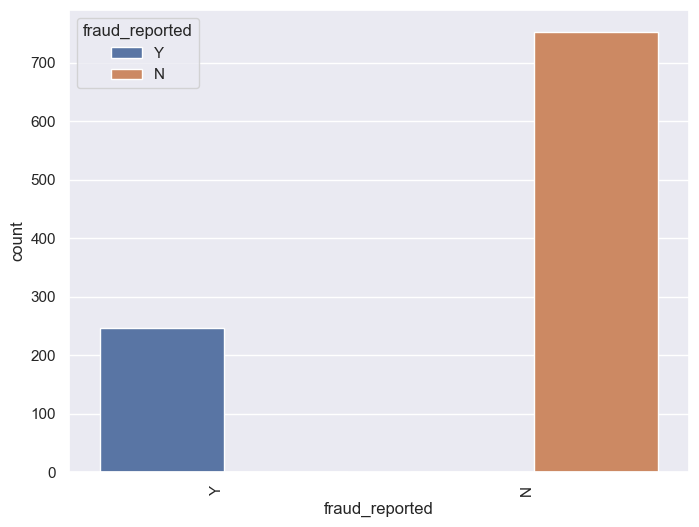

In [33]:
for i in categorical_col:
    plt.figure(figsize=(8,6))
    sns.countplot(x=df[i], hue='fraud_reported',data=df)
    plt.xticks(rotation=90,ha='right')
plt.show()

Multivariate Analysis

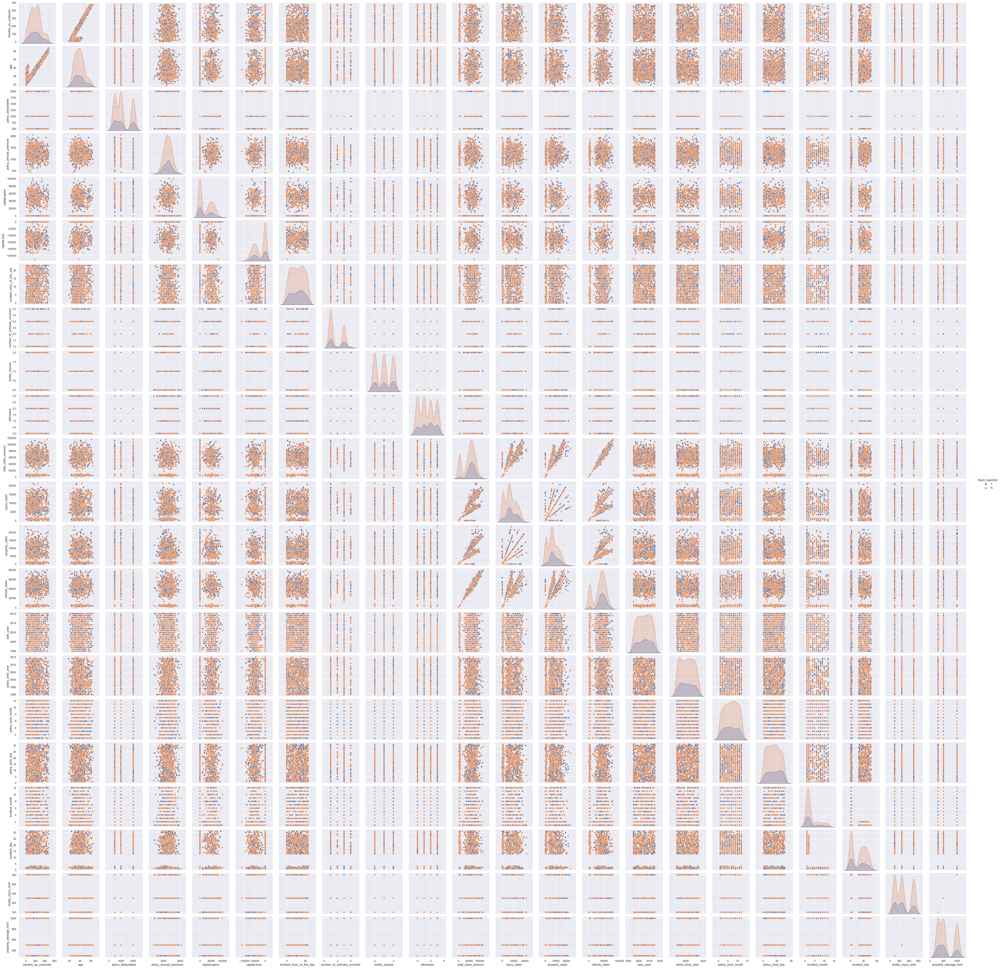

In [34]:
sns.pairplot(df,hue="fraud_reported")
plt.show()

Outliers Detection

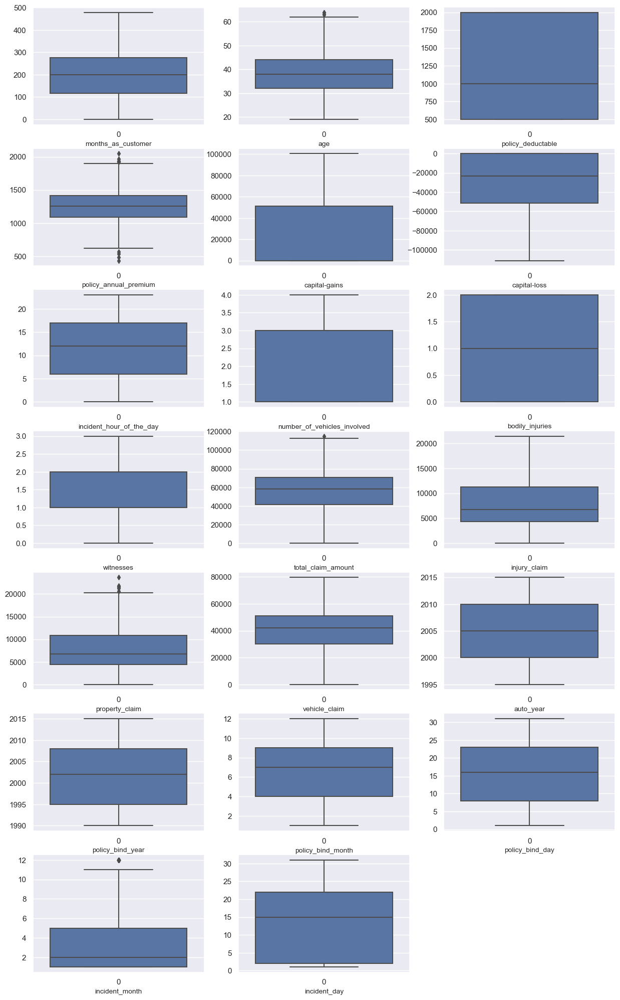

<Figure size 640x480 with 0 Axes>

In [35]:
#Plotting the box plots to check the outliers in the dataset

plt.figure(figsize=(15,25))
p=1
for i in numerical_col:
    if p<=20:
        plt.subplot(7,3,p)
        sns.boxplot(df[i])
        plt.xlabel(i,fontsize=10)
    p+=1
plt.show()
plt.tight_layout()

In [36]:
from scipy.stats import zscore
features=df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]
z=np.abs(zscore(features))
z

,age,policy_annual_premium,total_claim_amount,property_claim,incident_month
0,0.990836,0.616705,0.714257,1.165505,0.735040
1,0.334073,0.242521,1.807312,1.372696,0.735040
2,1.088913,0.642233,0.686362,0.736072,0.429664
3,0.224613,0.652886,0.403135,0.219722,2.013343
4,0.552994,1.341980,1.753121,1.399654,0.429664
...,...,...,...,...,...
995,0.103769,0.222884,1.305049,0.273817,0.429664
996,0.224613,0.739141,2.111466,2.214794,0.735040
997,0.541611,0.520739,0.558507,0.020826,0.735040
998,2.523284,0.411866,0.219110,0.451976,0.429664


In [37]:
np.where(z>3)

(array([229, 248, 500, 763], dtype=int64), array([1, 1, 3, 1], dtype=int64))

In [38]:
df1=df[(z<3).all(axis=1)]

In [39]:
df1.shape[0]

996

In [40]:
df.shape[0]

1000

In [41]:
(df.shape[0]-df1.shape[0])/df.shape[0]*100

0.4

In [42]:
df=df[(z<3).all(axis=1)]
df.shape

(996, 39)

Checking the skewness of the dataset

In [43]:
df.skew().sort_values(ascending=False)

incident_month                 1.377097
property_damage_limit          0.609316
number_of_vehicles_involved    0.500364
capital-gains                  0.478850
age                            0.474526
policy_deductable              0.473229
bodily_injury_limit            0.413713
months_as_customer             0.359605
property_claim                 0.357130
injury_claim                   0.267970
policy_bind_year               0.058499
incident_day                   0.055659
policy_annual_premium          0.032042
policy_bind_day                0.028923
witnesses                      0.025758
bodily_injuries                0.011117
policy_bind_month             -0.029722
incident_hour_of_the_day      -0.039123
auto_year                     -0.049276
capital-loss                  -0.393015
total_claim_amount            -0.593473
vehicle_claim                 -0.619755
dtype: float64

In [44]:
skewness=["incident_month","property_damage_limit","total_claim_amount","vehicle_claim"]

In [45]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [46]:
df[skewness] = scaler.fit_transform(df[skewness].values)
df[skewness].head()

,incident_month,property_damage_limit,total_claim_amount,vehicle_claim
0,-1.101370,0.052612,0.717556,0.754553
1,-1.101370,0.052612,-1.777785,-1.787353
2,-0.026479,-1.174021,-0.716483,-0.820820
3,1.553647,0.052612,0.392931,0.678427
4,-0.026479,1.313327,-1.730555,-1.740710


In [47]:
#Encoding the categorical columns

from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df[categorical_col]= df[categorical_col].apply(le.fit_transform)

Correlation Matrix

In [48]:
df.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_model,auto_year,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,bodily_injury_limit,property_damage_limit
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,...,0.002908,0.001287,0.020966,-0.046010,0.004955,0.054175,0.019029,-0.013502,-0.022063,-0.022928
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,...,0.016258,0.003268,0.012408,-0.035505,0.015874,0.054465,0.016685,-0.008174,-0.012844,-0.012459
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,...,-0.024513,0.002323,0.028864,-0.005709,0.071527,0.001030,0.026233,0.013370,-0.005866,-0.000653
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,...,-0.003597,0.027497,0.015833,-0.048465,-0.051368,0.011204,-0.000169,-0.018867,0.006634,0.006179
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,...,-0.034998,-0.040439,-0.010174,0.001650,-0.028452,-0.030886,-0.012386,0.016400,0.028569,0.030755
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,...,-0.017679,-0.028638,0.032173,-0.031981,-0.007259,0.045694,0.024223,-0.007249,-0.019001,-0.008959
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,...,0.050878,0.045094,0.011520,0.017801,-0.007489,0.014464,0.069312,-0.055411,0.011093,0.010425
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,...,0.020878,-0.004827,0.003335,-0.025282,0.024516,-0.003030,0.013226,-0.022786,0.018978,0.019575
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,...,0.031208,-0.015606,-0.047983,-0.013819,-0.005233,0.028387,-0.001239,0.014295,-0.013322,-0.007772
insured_relationship,0.071097,0.075940,-0.018855,-0.021763,0.006474,0.004104,-0.021595,-0.008141,-0.097837,1.000000,...,0.062286,-0.026099,0.017992,-0.006190,0.040931,0.008900,0.039255,-0.083525,-0.022125,-0.031298


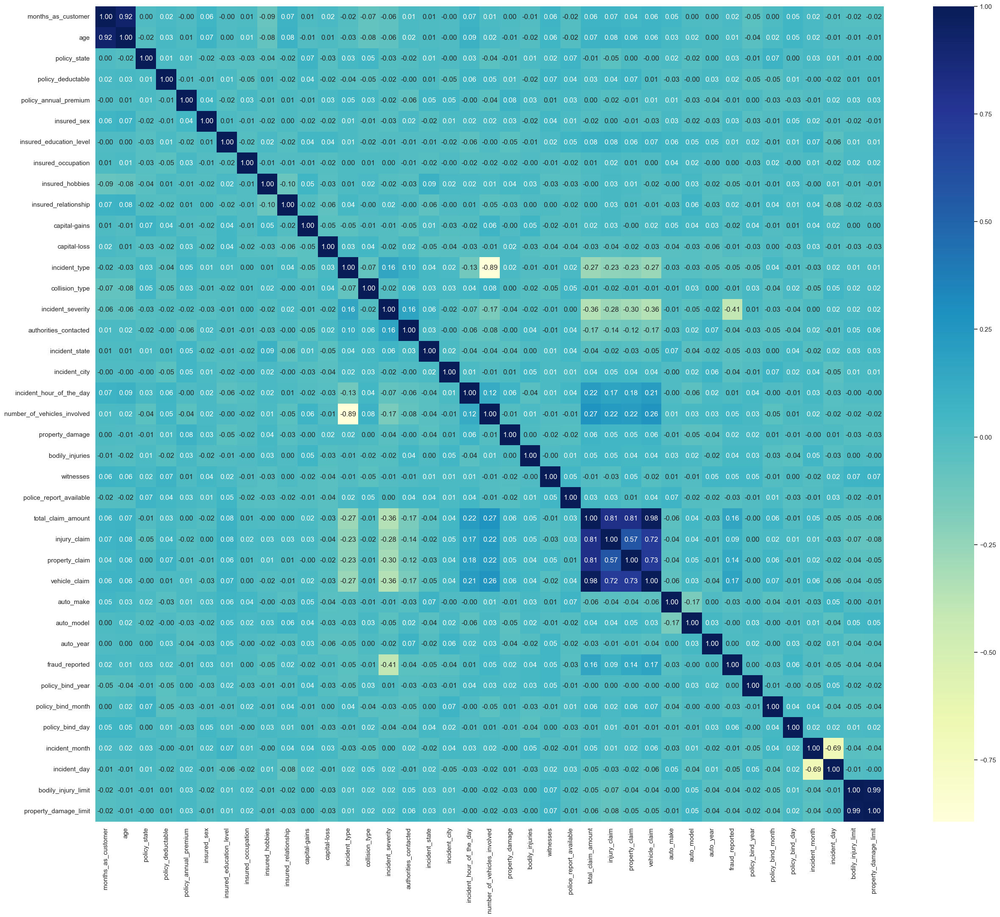

In [49]:
plt.figure(figsize=(30,25))
sns.heatmap(df.corr(), fmt='0.2f', annot=True, cmap='YlGnBu')
plt.show()

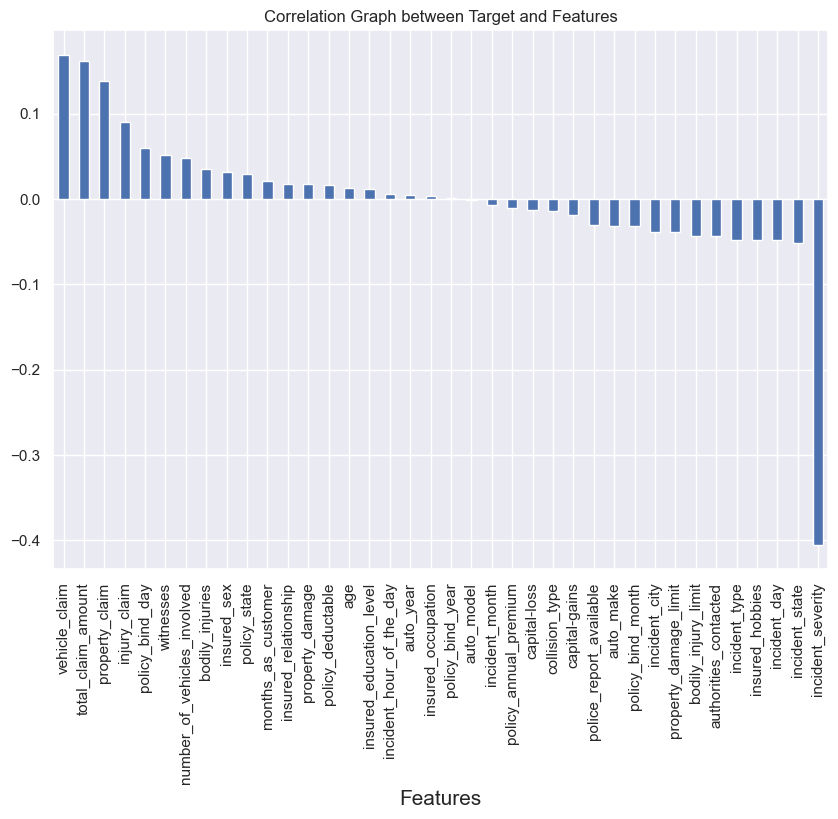

In [50]:
plt.figure(figsize=(10,7))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot.bar()
plt.title("Correlation Graph between Target and Features")
plt.xlabel("Features",fontsize=15)
plt.show()

Seperating Features and Target

In [51]:
X = df.drop("fraud_reported", axis=1)
Y = df["fraud_reported"]

Feature Scaling using Standard Scalarization

In [52]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,...,auto_make,auto_model,auto_year,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day,bodily_injury_limit,property_damage_limit
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,...,0.857248,-1.644810,-0.182338,1.686176,1.013751,0.177487,-1.101370,1.139807,-0.137684,0.052612
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,...,0.360986,-0.657437,0.316587,0.599693,-0.166145,1.309223,-1.101370,0.756374,-0.137684,0.052612
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,...,-0.631538,0.958263,0.316587,-0.215170,-0.166145,-0.727901,-0.026479,0.852233,-1.066352,-1.174021
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,...,-0.879669,1.317308,1.480744,-1.573274,-0.461119,1.082875,1.553647,-1.160788,-0.137684,0.052612
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,...,-1.624063,1.048024,0.649203,1.686176,-0.166145,-1.067422,-0.026479,0.372942,1.410096,1.313327


Varinace Inflation Factor

In [53]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [54]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
vif['features'] = X.columns
vif

,VIF Values,features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


In [55]:
X.drop(["total_claim_amount"],axis=1,inplace=True)

In [56]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
vif['features'] = X.columns
vif

,VIF Values,features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


In [57]:
X.drop(["property_damage_limit"],axis=1,inplace=True)

In [58]:
vif=pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
vif['features'] = X.columns
vif

,VIF Values,features
0,6.847077,months_as_customer
1,6.852905,age
2,1.038072,policy_state
3,1.043977,policy_deductable
4,1.036330,policy_annual_premium
5,1.029258,insured_sex
6,1.046990,insured_education_level
7,1.016674,insured_occupation
8,1.049392,insured_hobbies
9,1.048658,insured_relationship


In [59]:
Y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [60]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, Y = SM.fit_resample(X,Y)

In [61]:
Y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

# Modeling

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,f1_score

In [63]:
maxaccu=0
maxRS=0

for i in range(0,200):
    x_train,x_test,y_train,y_test= train_test_split(X,Y,random_state=i,test_size=.30)
    LR= LogisticRegression()
    LR.fit(x_train,y_train)
    pred= LR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxaccu:
        maxaccu=acc
        maxRS=i
print("Best accuracy is ",maxaccu,"at Random State =",maxRS)

Best accuracy is  0.78 at Random State = 77


In [64]:
x_train,x_test,y_train,y_test= train_test_split(X,Y,random_state=77,test_size=.30)

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [66]:
LR_model= LogisticRegression()
RD_model= RidgeClassifier()
DT_model= DecisionTreeClassifier()
SV_model= SVC()
KNR_model= KNeighborsClassifier()
RFR_model= RandomForestClassifier()
SGH_model= SGDClassifier()
Bag_model=BaggingClassifier()
ADA_model=AdaBoostClassifier()
GB_model= GradientBoostingClassifier()

model=[LR_model,RD_model,DT_model,SV_model,KNR_model,RFR_model,SGH_model,Bag_model,ADA_model,GB_model ]

In [67]:
for m in model:
    m.fit(x_train,y_train)
    pred= m.predict(x_test)
    print('Accuracy Score of ',m, 'is', accuracy_score(y_test,pred)*100)
    print('Accuracy Score of the training data is', m.score(x_train,y_train)*100)
    print('Confusion Matrix of ',m,' is \n', confusion_matrix(y_test,pred) )
    print(classification_report(y_test,pred))
    print('*'*100)

Accuracy Score of  LogisticRegression() is 78.0
Accuracy Score of the training data is 73.71428571428571
Confusion Matrix of  LogisticRegression()  is 
 [[181  41]
 [ 58 170]]
              precision    recall  f1-score   support

           0       0.76      0.82      0.79       222
           1       0.81      0.75      0.77       228

    accuracy                           0.78       450
   macro avg       0.78      0.78      0.78       450
weighted avg       0.78      0.78      0.78       450

****************************************************************************************************
Accuracy Score of  RidgeClassifier() is 77.11111111111111
Accuracy Score of the training data is 73.33333333333333
Confusion Matrix of  RidgeClassifier()  is 
 [[176  46]
 [ 57 171]]
              precision    recall  f1-score   support

           0       0.76      0.79      0.77       222
           1       0.79      0.75      0.77       228

    accuracy                           0.77      

Cross Validation

In [68]:
from sklearn.model_selection import cross_val_score

In [69]:
for i in model:
    print('Accuracy_Score of ',i, 'is', accuracy_score(y_test,i.predict(x_test))*100)
    print("cross Validation accuracy score of ",i ," is ",cross_val_score(i,X,Y,cv=5, scoring='accuracy').mean()*100)
    print('\n')
    print('*'*50)
    print('\n')

Accuracy_Score of  LogisticRegression() is 78.0
cross Validation accuracy score of  LogisticRegression()  is  73.73333333333333


**************************************************


Accuracy_Score of  RidgeClassifier() is 77.11111111111111
cross Validation accuracy score of  RidgeClassifier()  is  73.06666666666666


**************************************************


Accuracy_Score of  DecisionTreeClassifier() is 84.0
cross Validation accuracy score of  DecisionTreeClassifier()  is  82.4


**************************************************


Accuracy_Score of  SVC() is 85.77777777777777
cross Validation accuracy score of  SVC()  is  86.6


**************************************************


Accuracy_Score of  KNeighborsClassifier() is 67.33333333333333
cross Validation accuracy score of  KNeighborsClassifier()  is  65.93333333333334


**************************************************


Accuracy_Score of  RandomForestClassifier() is 87.33333333333333
cross Validation accuracy score

Hyper Parameter Tuning

In [70]:
from sklearn.model_selection import GridSearchCV

In [71]:
parameters= {'n_estimators':[100,1000],'learning_rate':[0.001, 0.1],'min_samples_leaf':[1,10], 'max_features':[0.5,1.0]}

In [72]:
GCV=GridSearchCV(GradientBoostingClassifier(), parameters, cv=5)

In [73]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.001, 0.1],
                         'max_features': [0.5, 1.0],
                         'min_samples_leaf': [1, 10],
                         'n_estimators': [100, 1000]})

In [74]:
GCV.best_params_

{'learning_rate': 0.1,
 'max_features': 1.0,
 'min_samples_leaf': 10,
 'n_estimators': 1000}

In [75]:
Final_model = GradientBoostingClassifier(learning_rate=0.1,max_features= 1.0,min_samples_leaf= 10,n_estimators= 1000)

In [76]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=Final_model)

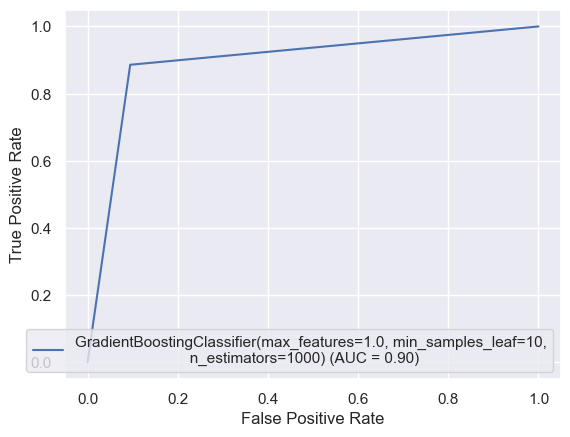

In [77]:
display.plot()

In [78]:
import joblib
joblib.dump(Final_model, "Insurance_fraud-prediction")

['Insurance_fraud-prediction']

In [79]:
model=joblib.load("Insurance_fraud-prediction")

In [80]:
model.fit(x_train,y_train)
prediction=model.predict(x_test)
prediction

array([1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,

In [81]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,1,1
1,0,0
2,0,0
3,1,1
4,0,0
...,...,...
445,0,0
446,0,1
447,1,1
448,1,1
